In [1]:
from pandas import DataFrame, Grouper
import pandas as pd
import numpy as np
from datetime import datetime
import sys
import world_bank_data as wb
import seaborn as sns
import matplotlib.pyplot as plt


In [2]:
# import our own stuff
sys.path.append("../python/src")

from worldbankApi import get_regionnames, fetch_series, default_series, get_all_countries


In [3]:
# set some options
pd.set_option('display.max_rows', 600)
pd.set_option('display.max_columns', 600)
pd.set_option('display.width', None)
pd.set_option('display.max_colwidth', None)

datadir = "../data/"
cachedir = "../data/cache" 

In [4]:
#wb.search_indicators('water')

In [5]:
mdg_series = {
    'ER.H2O.FWTL.ZS': 'Annual freshwater withdrawals, total (% of internal resources)',
    'ER.H2O.FWTL.K3': 'Annual freshwater withdrawals, total (billion cubic meters)',
    'ER.H2O.FWST.ZS': 'Level of water stress: freshwater withdrawal as a proportion of available freshwater resources',
    'SH.H2O.BASW.ZS': 'People using at least basic drinking water services (% of population)',
    'SG.H2O.TM30.HH.ZS': 'Households with water 30 minutes or longer away round trip (%)',
    'SG.H2O.TL30.HH.ZS': 'Households with water less than 30 minutes away round trip (%)',
    'SG.H2O.PRMS.HH.ZS': 'Households with water on the premises (%)',
    # 'SH.H2O.SAFE.ZS': 'Improved water source (% of population with access)', # not accessibale -> archiv
    'SH.H2O.SMDW.ZS': 'People using safely managed drinking water services (% of population)',
    # 'SH.STA.ACSN': 'Improved sanitation facilities (% of population with access)', #  not accessibale -> archiv
    'SP.POP.TOTL': 'Population, total',
#    'IN.POV.HH.DRNKNGWATER.TOTL.PCT': 'Households Access to Safe Drinking Water - Total (%) (india)', # Country Partnership Strategy for India (FY2013 - 17)
#    'IN.POV.HH.DRKNGWATER.WITHIN': 'Availability of drinking water source within the premises (india)',
#    'IN.POV.HH.DRKNGWATER.NEAR': 'Availability of drinking water source near the premises (india)',
#    'IN.POV.HH.DRKNGWATER.AWAY': 'Availability of drinking water from a source away (india)',
#    'IN.POV.HH.DRKNGWATER': 'Total households with drinking water facility (india)',
    'IE.PPN.WATR.CD': 'Public private partnerships investment in water and sanitation (current US$)',
    'IE.PPI.WATR.CD': 'Investment in water and sanitation with private participation (current US$)',
    'IC.WAT.GIFT.ZS': 'Expected to give gifts to get a water connection (% of firms)',
    'IC.FRM.CORR.CORR7': 'Percent of firms expected to give gifts to get a water connection',
    'IC.WAT.DURS': 'Delay in obtaining a water connections (days)',
    'IC.FRM.INFRA.IN6':'Number of water insufficiencies in a typical month',
#    'HOU.H2O.ACSN.ZS': 'Household Access to Safe Water (in % of total household) (indonesia)',
    'ER.H2O.INTR.PC': 'Renewable internal freshwater resources per capita (cubic meters)',
    'ER.H2O.INTR.K3': 'Renewable internal freshwater resources, total (billion cubic meters)',
#    '5.51.01.09.water': 'Access to water' # usless data
    
}

df = fetch_series(series=mdg_series,date="2000:2017")
countrynames = get_all_countries(cachedir=cachedir,includeaggs=True)
df.rename(columns=mdg_series,inplace=True)
#display(countrynames)


Reading Data from cached file: data/cache/ER.H2O.FWTL.ZS.p
Reading Data from cached file: data/cache/ER.H2O.FWTL.K3.p
Reading Data from cached file: data/cache/ER.H2O.FWST.ZS.p
Reading Data from cached file: data/cache/SH.H2O.BASW.ZS.p
Reading Data from cached file: data/cache/SG.H2O.TM30.HH.ZS.p
Reading Data from cached file: data/cache/SG.H2O.TL30.HH.ZS.p
Reading Data from cached file: data/cache/SG.H2O.PRMS.HH.ZS.p
Reading Data from cached file: data/cache/SH.H2O.SMDW.ZS.p
Reading Data from cached file: data/cache/SP.POP.TOTL.p
Reading Data from cached file: data/cache/IE.PPN.WATR.CD.p
Reading Data from cached file: data/cache/IE.PPI.WATR.CD.p
Reading Data from cached file: data/cache/IC.WAT.GIFT.ZS.p
Reading Data from cached file: data/cache/IC.FRM.CORR.CORR7.p
Reading Data from cached file: data/cache/IC.WAT.DURS.p
Reading Data from cached file: data/cache/IC.FRM.INFRA.IN6.p
Reading Data from cached file: data/cache/ER.H2O.INTR.PC.p
Reading Data from cached file: data/cache/ER.H2O

In [6]:
# read the historical classification in Incomegroups from the worldbank
icgroup_df = pd.read_csv(datadir+"/OGHIST.csv",header=0,quotechar='"',low_memory=False,sep=";",na_values=['..'])

# the historical data some datapoints
# fill missing values with the value from the next valid year 
# this is a little dirty in code
T = icgroup_df.T
#display(T)
#display(T.describe())
T = T.fillna(method ='backfill') 
#display(T)
#display(T.describe())
icgroup_df = T.T
icgroup_df = icgroup_df.melt(id_vars=('id','Country'),var_name="Year")
#display(icgroup_df.sample())
# replace the values used for classification with the values used by oecd
icgroup_df = icgroup_df.replace({'value': {'L': 'LDCs','LM': 'LMICs', 'UM':'UMICs','H': 'HICs', 'LM*':'LMICs'}})
# give it a nice name
icgroup_df = icgroup_df.rename(columns={'value': 'IncomeGroup'})
# create a mergeable unique feature
icgroup_df['mergefield'] = icgroup_df['Year'].apply(lambda x: str(x))
icgroup_df['mergefield'] = icgroup_df['mergefield'] + icgroup_df['id']
#display(icgroup_df.sample(10))

# create a mergefield within the dataframe 
df['mergefield'] = df['Year']
df['mergefield'] = df['mergefield'] + df['Country']
#display(df.sample())
df = df.merge(icgroup_df.add_prefix("worldbank "),
                       right_on='worldbank mergefield',
                       how="left",left_on='mergefield',indicator=True)
df.drop(columns=['mergefield','worldbank id','worldbank Country',
                'worldbank Year','worldbank mergefield','_merge'],inplace=True)
#display(df.sample(5))

df.replace(countrynames,inplace=True)
display(df.sample(5))

,Country,Year,"Annual freshwater withdrawals, total (% of internal resources)","Annual freshwater withdrawals, total (billion cubic meters)",Level of water stress: freshwater withdrawal as a proportion of available freshwater resources,People using at least basic drinking water services (% of population),Households with water 30 minutes or longer away round trip (%),Households with water less than 30 minutes away round trip (%),Households with water on the premises (%),People using safely managed drinking water services (% of population),"Population, total",Public private partnerships investment in water and sanitation (current US$),Investment in water and sanitation with private participation (current US$),Expected to give gifts to get a water connection (% of firms),Percent of firms expected to give gifts to get a water connection,Delay in obtaining a water connections (days),Number of water insufficiencies in a typical month,Renewable internal freshwater resources per capita (cubic meters),"Renewable internal freshwater resources, total (billion cubic meters)",worldbank IncomeGroup
3444,Equatorial Guinea,1987,0.038462,0.01,0.0,0.000000,0.0,0.0,0.0,0.000000,382981.0,0.0,0.0,0.0,0.0,0.0,0.0,67888.48533,26.0,LDCs
8019,Rwanda,2011,0.000000,0.00,0.0,53.442288,0.0,0.0,0.0,0.000000,10293331.0,0.0,0.0,9.2,7.0,0.0,1.0,0.00000,0.0,LDCs
6412,Mongolia,1996,0.000000,0.00,0.0,0.000000,0.0,0.0,0.0,0.000000,2316568.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00000,0.0,LDCs
3181,United Kingdom,2004,0.000000,0.00,0.0,100.000002,0.0,0.0,0.0,99.968613,59987905.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00000,0.0,HICs
317,Argentina,2017,0.000000,0.00,0.0,0.000000,0.0,0.0,0.0,0.000000,44044811.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00000,0.0,HICs


Francesca is exporting herself a nice csv!

In [7]:
# Global view for first grouped streamgraph
df.to_csv('data/Millennium_water_access.csv', sep=',', index=False, na_rep='NaN')

Breaking down the original dataframe by filtering according to `[worldbank IncomeGroup]` column

In [8]:
no2018 = noNan.loc[(noNan['Year'] != '2018')]
no2018.to_csv('data/noHICs_reduced.csv', sep=',', index=False, na_rep='NaN')

,Country,Year,"Annual freshwater withdrawals, total (% of internal resources)","Annual freshwater withdrawals, total (billion cubic meters)",Level of water stress: freshwater withdrawal as a proportion of available freshwater resources,People using at least basic drinking water services (% of population),Households with water 30 minutes or longer away round trip (%),Households with water less than 30 minutes away round trip (%),Households with water on the premises (%),People using safely managed drinking water services (% of population),"Population, total",Public private partnerships investment in water and sanitation (current US$),Investment in water and sanitation with private participation (current US$),Expected to give gifts to get a water connection (% of firms),Percent of firms expected to give gifts to get a water connection,Delay in obtaining a water connections (days),Number of water insufficiencies in a typical month,Renewable internal freshwater resources per capita (cubic meters),"Renewable internal freshwater resources, total (billion cubic meters)",worldbank IncomeGroup
0,Aruba,1980,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,60096.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
1,Aruba,1981,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,60567.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
2,Aruba,1982,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,61345.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
3,Aruba,1983,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,62201.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
4,Aruba,1984,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,62836.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
5,Aruba,1985,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,63026.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
6,Aruba,1986,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,62644.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
7,Aruba,1987,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,61833.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,HICs
8,Aruba,1988,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,61079.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,HICs
9,Aruba,1989,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,61032.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,HICs


In [9]:
# Exporting all countries avoiding 1999 and 2018 (always set to zero)
no2018.to_csv('data/Millennium_water_access.csv', sep=',', index=False, na_rep='NaN')

In [10]:
# Looping and exporting
for group in incomegroups:
    filtered = no2018.loc[(no2018['worldbank IncomeGroup'] == group)]
    countries = filtered['Country'].unique()
    filtered.to_csv('data/Millennium_{0}_group.csv'.format(group), sep=',', index=False, na_rep='nan')
    print('{0} done'.format(group))

nan done
HICs done
UMICs done
LDCs done
LMICs done


In [11]:
df

,Country,Year,"Annual freshwater withdrawals, total (% of internal resources)","Annual freshwater withdrawals, total (billion cubic meters)",Level of water stress: freshwater withdrawal as a proportion of available freshwater resources,People using at least basic drinking water services (% of population),Households with water 30 minutes or longer away round trip (%),Households with water less than 30 minutes away round trip (%),Households with water on the premises (%),People using safely managed drinking water services (% of population),"Population, total",Public private partnerships investment in water and sanitation (current US$),Investment in water and sanitation with private participation (current US$),Expected to give gifts to get a water connection (% of firms),Percent of firms expected to give gifts to get a water connection,Delay in obtaining a water connections (days),Number of water insufficiencies in a typical month,Renewable internal freshwater resources per capita (cubic meters),"Renewable internal freshwater resources, total (billion cubic meters)",worldbank IncomeGroup,People using safely managed drinking water services (absolut),People not using safely managed drinking water services (% of population),People using at least basic drinking water services (absolut),People not using at least basic drinking water services (% of population)
0,Aruba,1999,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,89005.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.00,HICs,0.0,100.0,0.000000e+00,100.000000
1,Aruba,2000,0.0,0.0,0.000000,94.488806,0.0,0.0,0.0,0.0,90853.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.00,HICs,0.0,100.0,8.584592e+04,5.511194
2,Aruba,2001,0.0,0.0,0.000000,94.770491,0.0,0.0,0.0,0.0,92898.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.00,HICs,0.0,100.0,8.803989e+04,5.229509
3,Aruba,2002,0.0,0.0,0.000000,95.052176,0.0,0.0,0.0,0.0,94992.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.00,HICs,0.0,100.0,9.029196e+04,4.947824
4,Aruba,2003,0.0,0.0,0.000000,95.333861,0.0,0.0,0.0,0.0,97017.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.00,HICs,0.0,100.0,9.249005e+04,4.666139
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5253,Zimbabwe,2014,0.0,0.0,24.287928,65.473381,0.0,0.0,0.0,0.0,13586681.0,0.0,0.0,0.0,0.0,0.0,0.0,902.354298,12.26,LDCs,0.0,100.0,8.895659e+06,34.526619
5254,Zimbabwe,2015,0.0,0.0,0.000000,64.985831,16.5,45.4,37.6,0.0,13814629.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.00,LDCs,0.0,100.0,8.977551e+06,35.014169
5255,Zimbabwe,2016,0.0,0.0,0.000000,64.511616,0.0,0.0,0.0,0.0,14030390.0,0.0,0.0,0.0,0.0,0.0,1.5,0.000000,0.00,LDCs,0.0,100.0,9.051231e+06,35.488384
5256,Zimbabwe,2017,0.0,0.0,0.000000,64.051230,0.0,0.0,0.0,0.0,14236745.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.00,LDCs,0.0,100.0,9.118810e+06,35.948770


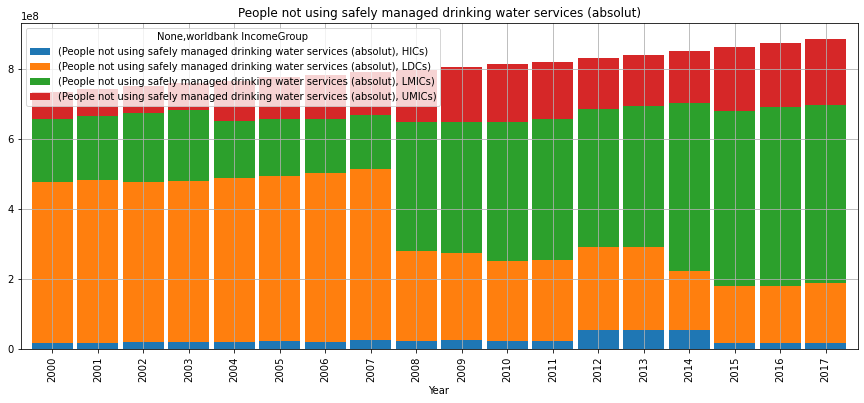

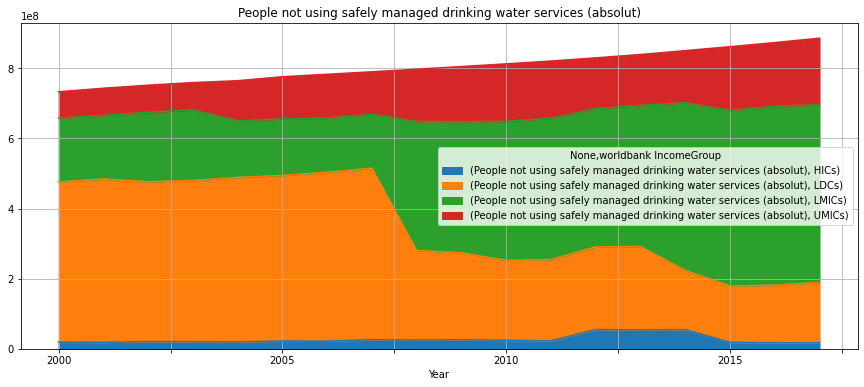

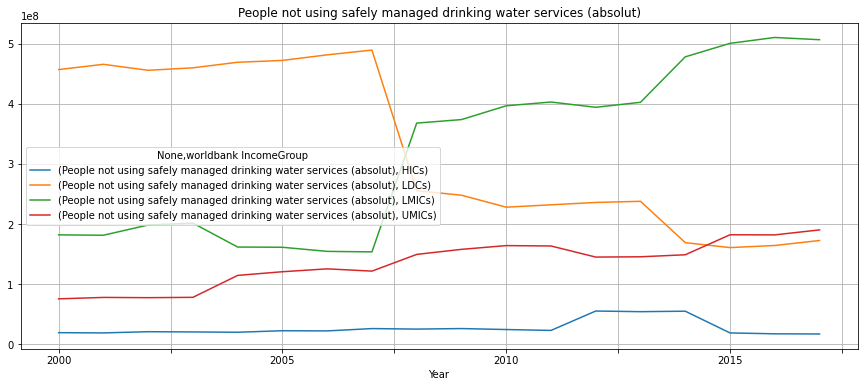

In [11]:
i = 'People using safely managed drinking water services (absolut)'
j = 'People not using safely managed drinking water services (absolut)'
k = 'Population, total'
l = 'People using safely managed drinking water services (% of population)'
m = 'People not using safely managed drinking water services (% of population)'

df[i] = df[l] * df[k] / 100
df[m] = 100 - df[l]
tmp = df[['Year','worldbank IncomeGroup',i,k]].copy()
tmp.replace({i: {0.0: np.nan}},inplace=True)
tmp[j] = tmp[k] - tmp[i]
tmp = tmp[~tmp[j].isnull()]
tmp = tmp[tmp['Year'].isin(list(map(lambda x: str(x),range(2000,20200))))]

#tmp = tmp[tmp['worldbank IncomeGroup'].isin(['LMICs','LDCs','UMICs'])]
tmp_agg = tmp[['Year',j,'worldbank IncomeGroup']].groupby(['Year','worldbank IncomeGroup']).sum()
#display(tmp_agg)
tmp_agg.unstack().plot(width=0.9,grid=True,stacked=True,kind='bar',title=j,figsize=(15,6))
tmp_agg.unstack().plot(grid=True,stacked=True,kind='area',title=j,figsize=(15,6))
tmp_agg.unstack().plot(grid=True,title=j,figsize=(15,6))

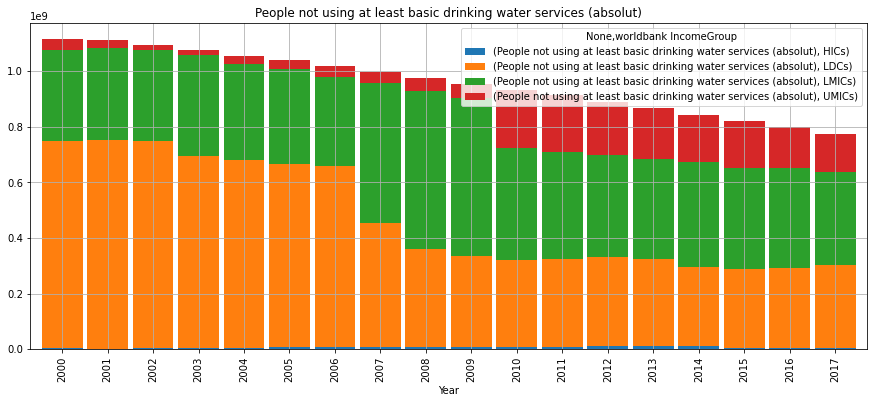

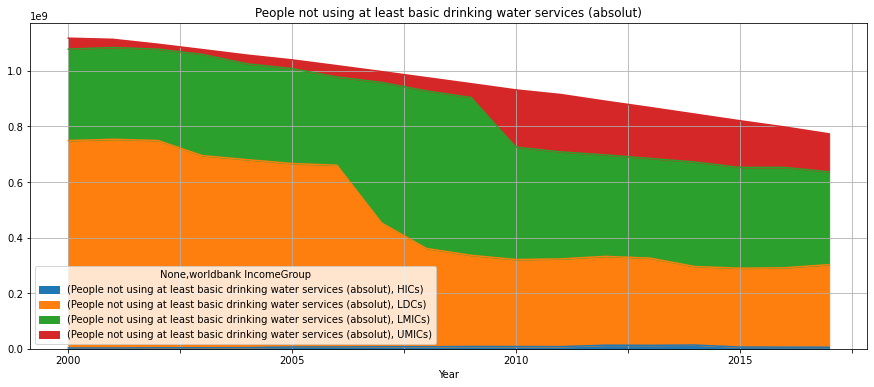

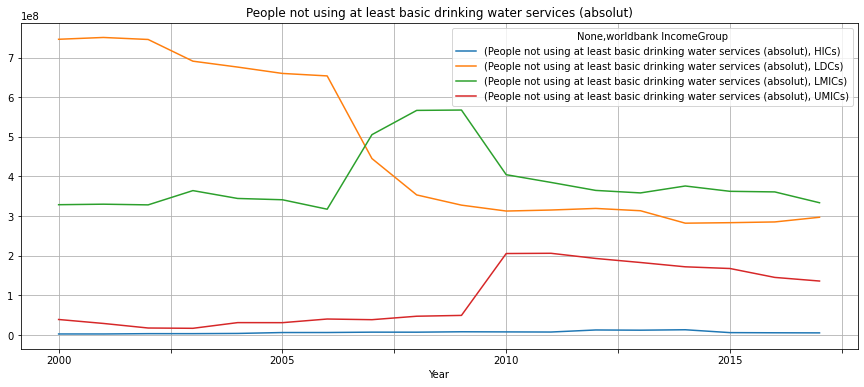

In [12]:
i = 'People using at least basic drinking water services (absolut)' 
j = 'People not using at least basic drinking water services (absolut)'
k = 'Population, total'
l = 'People using at least basic drinking water services (% of population)'
m = 'People not using at least basic drinking water services (% of population)'

df[i] = df[l] * df[k] / 100
df[m] = 100 - df[l]
tmp = df[['Year','worldbank IncomeGroup',i,k]].copy()
tmp.replace({i: {0.0: np.nan}},inplace=True)
tmp[j] = tmp[k] - tmp[i]
tmp = tmp[~tmp[j].isnull()]

tmp = tmp[tmp['Year'].isin(list(map(lambda x: str(x),range(2000,2020))))]

#tmp = tmp[tmp['worldbank IncomeGroup'].isin(['LMICs','LDCs','UMICs'])]
tmp_agg = tmp[['Year',j,'worldbank IncomeGroup']].groupby(['Year','worldbank IncomeGroup']).sum()
#display(tmp_agg)
tmp_agg.unstack().plot(width=0.9,grid=True,stacked=True,kind='bar',title=j,figsize=(15,6))
tmp_agg.unstack().plot(grid=True,stacked=True,kind='area',title=j,figsize=(15,6))
tmp_agg.unstack().plot(grid=True,title=j,figsize=(15,6))

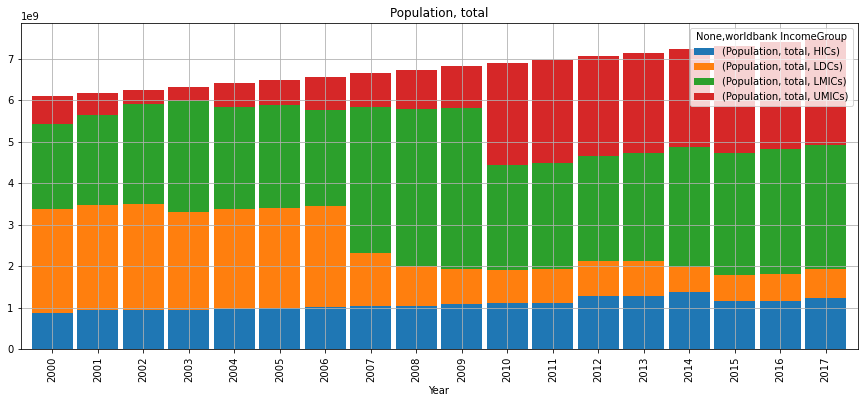

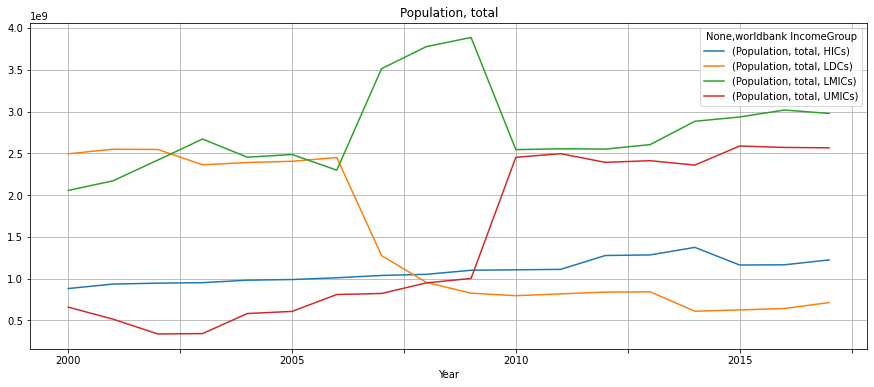

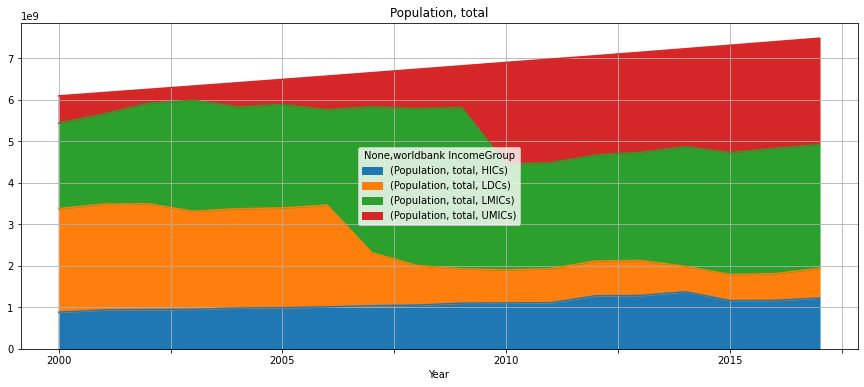

In [13]:
tmp = df[['Year','worldbank IncomeGroup',k]].copy()
tmp = tmp[tmp['Year'].isin(list(map(lambda x: str(x),range(2000,2017))))]
tmp.replace({k: {0.0: np.nan}},inplace=True)
tmp = tmp[~tmp[k].isnull()]
#tmp = tmp[tmp['worldbank IncomeGroup'].isin(['LMICs','LDCs','UMICs'])]
tmp_agg = tmp.groupby(['Year','worldbank IncomeGroup']).sum()
#display(tmp_agg)
tmp_agg.unstack().plot(width=0.9,grid=True,stacked=True,kind='bar',title=k,figsize=(15,6))
tmp_agg.unstack().plot(grid=True,title=k,figsize=(15,6))
tmp_agg.unstack().plot(grid=True,stacked=True,kind='area',title=k,figsize=(15,6))

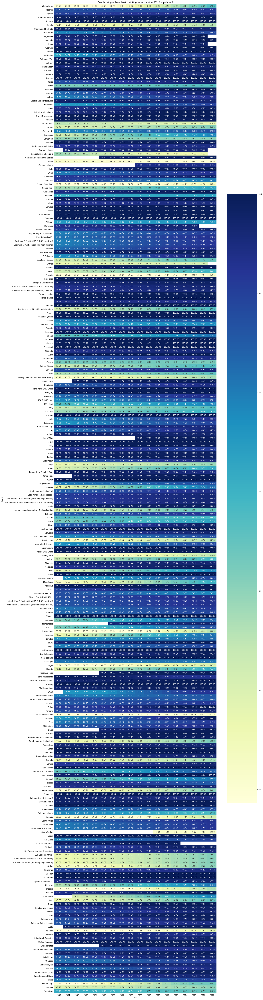

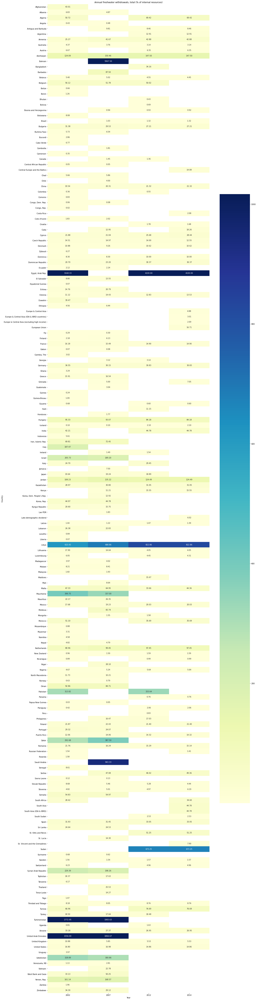

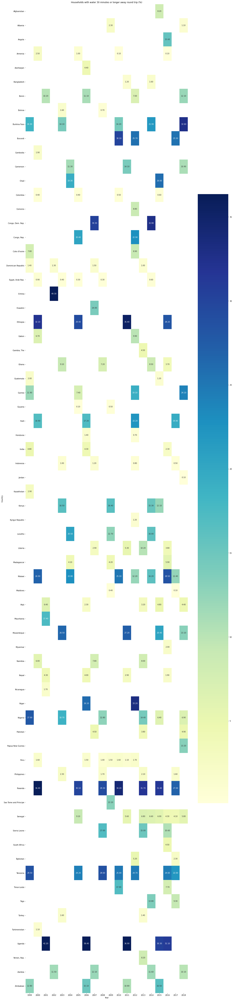

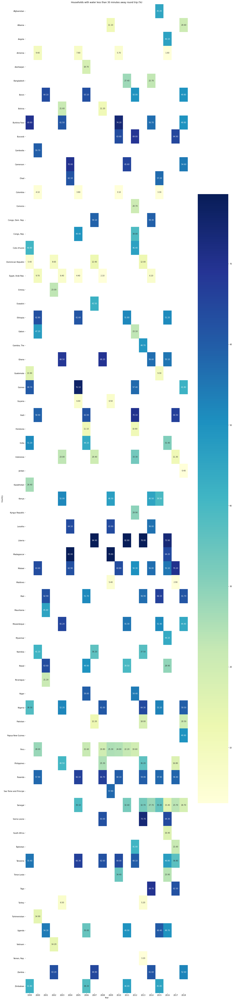

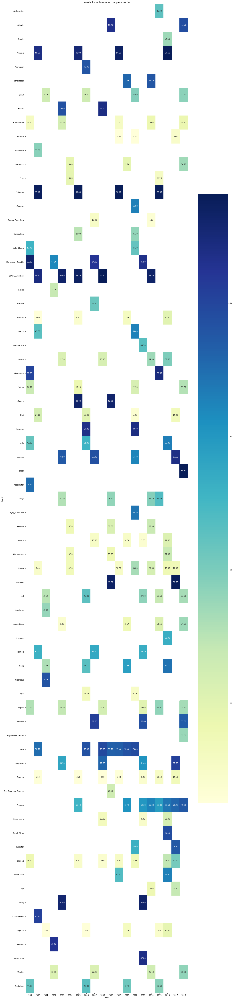

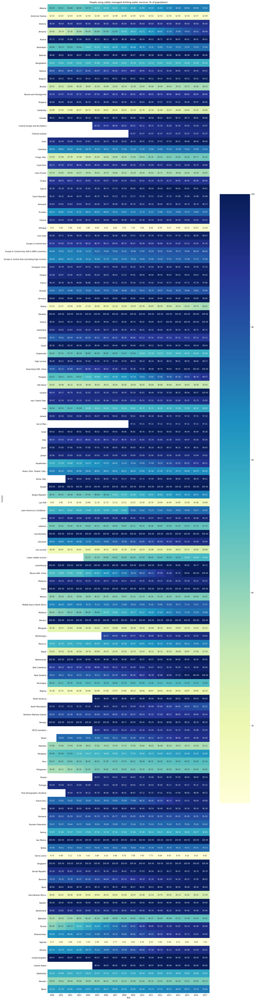

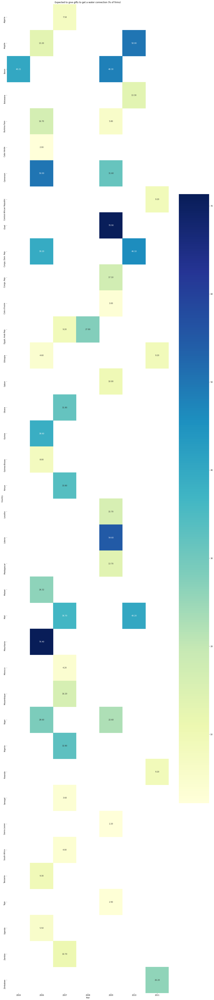

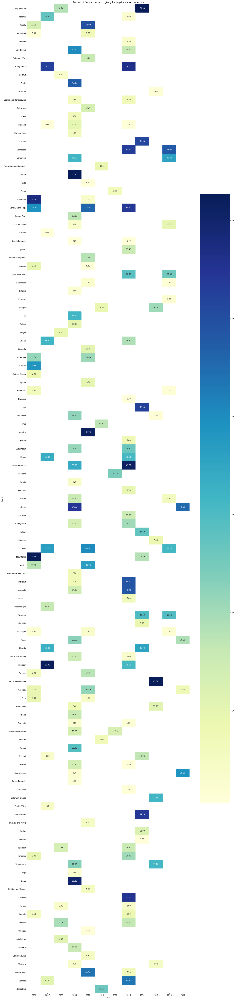

In [14]:
%matplotlib inline

for i in ['People using at least basic drinking water services (% of population)',
          'Annual freshwater withdrawals, total (% of internal resources)',
          'Households with water 30 minutes or longer away round trip (%)',
          'Households with water less than 30 minutes away round trip (%)',
          'Households with water on the premises (%)',
          'People using safely managed drinking water services (% of population)',
          'Expected to give gifts to get a water connection (% of firms)',
          'Percent of firms expected to give gifts to get a water connection',
         ]:

    tmp = df[['Country','Year',i]].copy()

    #display(tmp['People using at least basic drinking water services (% of population)'])
    tmp.replace({i: {0.0: np.nan}},inplace=True)
    tmp = tmp[~tmp[i].isnull()]
    #display(tmp.describe())
    tmp2 = tmp.pivot(index='Country', columns='Year', values=i)
    #display(tmp.groupby(['Country']).count())
    #tmp = tmp.set_index('Country')
    #tmp2.style.background_gradient(cmap='Blues')

    fig, ax = plt.subplots(figsize=(20,100)) 
    ax.set_title(i)
    sns.heatmap(tmp2, annot=True,ax=ax,fmt=".2f",cmap="YlGnBu",robust=True)